In [504]:
import sys
sys.path.append('../src')
import os

import warnings
warnings.simplefilter('ignore')

import pandas as pd
pd.set_option('display.max_columns', 150)
pd.set_option('display.max_rows', 150)
import pandas_profiling as pdp

import dask
import dask.dataframe as dd
from dask.distributed import LocalCluster

import stumpy

import cufflinks
cufflinks.go_offline()
import plotly
from plotly import express as px
import matplotlib.pyplot as plt

from glob import glob
from time import ctime
import numpy as np

from tqdm.notebook import tqdm

In [34]:
client = LocalCluster(processes=True, n_workers=10, threads_per_worker=2)
client

# UTILS

In [505]:
def get_file_date(path):
    return ctime(os.stat(path).st_ctime)

In [506]:
def to_datetime(df, date_columns):
    for col in date_columns:
        df[col] = pd.to_datetime(df[col])

In [507]:
def split_trip_nan(trip, min_length=10):
    res = []
    nans = np.where(trip.isna())[0]
    for i in range(len(nans)-1):
        tmp = trip.iloc[nans[i]+1:nans[i+1]]
        if len(tmp) >= min_length:
            res.append(tmp)
    return res

# CONST

In [508]:
DATA_PATH = '../data/decoded_forward/'

# EDA

In [509]:
files = glob(DATA_PATH+'*.csv')

print('Number of files:',len(files))
print('Last file data:', get_file_date(files[-1]))

Number of files: 2920
Last file data: Fri Jun 19 19:32:07 2020


In [510]:
USER_COLUMNS = [
    
    'time',
    'timeStop',
    'create_date',
    
    'car_vin', # ТО ЖЕ ЧТО И "CAR_id"? НЕ ВСЕГДА СОВПАДАЮТa
    'imei',
    'license_plate',
    'car_model',
    
    'lat',
    'lon',
    'alt',
    
    'speed',
    'sat', 
    'fuel', # 0 and -1

     'A2', # binary
     'A3', # binary
     'A4', # binary
    
     'RS232_0', 
     'RS232_1', 
    
    'Acc. Pedal 1 low idle switch',
    'Acc. Pedal Kickdown Switch',
    'Road speed limit status',
    'Acc. Pedal Position (%)',
    'Percent Load at current speed (%)',
    'Engine torque mode',
    "Driver's demand engine - percent torque (%)",
    'Actual engine - percent torque (%)',
    'Engine speed (rpm)',
    'Source address of controlling device for engine control',
    'Engine starter mode',
    'Engine demand, percent torque (%)',
    'Driver 1 working state',
    'Tachograph output shaft speed (rpm)',
    'Tachograph vehicle speed (km/h)',
    'EBS brake switch',
    'Brake pedal position (%)',
    'ABS off-road switch',
    'ASR off-road switch',
    'ASR "Hill Holder" switch',
    'Traction control override switch',
    'Accelerator interlock switch',
    'Engine derate switch',
    'Auxilary engine shutdown switch',
    'Remote accelerator enable switch',
    'Engine retarder selection',
    'ABS fully operational',
    'EBS red warning signal',
    'ABS/EBS amber warning signal',
    'ATC/ASR information signal',
    'Source address of contolling device for brake control',
    'Trailer ABS status',
    'Tractor mounted trailer ABS warning signal',
    'Trip Distance (km)',
    'Total Vehicle Distance (km)',
    'Trip Fuel (L)',
    'Total Fuel Used (L)',
    'Engine coolant temperature (C)',
    'Fuel temperature (C)',
    'Engine oil temperature 1 (C)',
    'Turbo oil temperature (C)',
    'Engine intercooler temperature (C)',
    'Engine intercooler thermostat opening (%)',
    'Fuel Delivery Pressure (kPa)',
    'Extended Crankcase Blow-by Pressure (kPa)',
    'Engine Oil Level (%)',
    'Engine Oil Pressure (kPa)',
    'Crankcase Pressure (kPa)',
    'Coolant Level (%)',
    'Washer Fluid Level (%)',
    'Fuel Level (%)',
    'Fuel Filter Differential Pressure (kPa)',
    'Engine Oil Filter Differential Pressure (kPa)',
    'Cargo Ambient Temperature (C)',
    'Axle Location',
    'Axle Weight (kg)',
    'Trailer Weight (kg)',
    'Cargo Weight (kg)',
    'Net Battery Current (A)',
    'Alternator Current (A)',
    'Charging System Potential (Voltage) (V)',
    'Battery Potential (V)',
    'Keyswitch Battery Potential (V)',
    'Two Speed Axle Switch',
    'Parking Brake Switch',
    'Cruise Control Pause Switch',
    'Park Brake Release Inhibit Request',
    'Wheel-Based Vehicle Speed (km/h)',
    'Cruise Control Active',
    'Cruise Control Enable Switch',
    'Brake Switch',
    'Clutch Switch',
    'Cruise Control Set Switch',
    'Cruise Control Resume Switch',
    'Cruise Control Accelerate Switch',
    'Cruise Control Set Speed (km/h)',
    'Cruise Control States',
    'Engine Idle Increment Switch',
    'Engine Idle Decrement Switch',
    'Engine Test Mode Switch',
    'Engine Shutdown Override Switch',
    'High Resolution Total Vehicle Distance (km)',
    'High Resolution Trip Distance (km)',
    'High Resolution Engine Trip Fuel (L)',
    'High Resolution Engine Total Fuel Used (L)'
]

In [511]:
N_FILES = 1000

In [512]:
%%time

df = []
for file in tqdm(files[-N_FILES:]):
    df.append(pd.read_csv(file, usecols=USER_COLUMNS))
df = pd.concat(df)


CPU times: user 1min 15s, sys: 0 ns, total: 1min 15s
Wall time: 4min 1s


In [45]:
%%time
df_list = [dask.delayed(pd.read_csv(file, usecols=USER_COLUMNS)) for file in files[-N_FILES:]]
df = dask.delayed(pd.concat)(df_list)
df = df.compute()

CPU times: user 1min 49s, sys: 15.4 s, total: 2min 5s
Wall time: 6min 19s


In [513]:
print('Shape:', df.shape)

Shape: (3400504, 103)


In [514]:
date_columns = ['time', 'timeStop', 'create_date']
to_datetime(df, date_columns)
df.set_index('time', inplace=True)

In [515]:
df.to_parquet('../data/mod/data.parquet')

# EDA

In [20]:
df = pd.read_parquet('../data/mod/data.parquet')

In [21]:
df = df.astype({
    'car_vin' :'str',
    'imei': 'str',
    'license_plate': 'str',
    'car_model': 'str',
    'lat':np.float16,
    'lon':np.float16,
    'alt':np.int32,
    'speed':np.uint8,
})

In [23]:
df.sample(5)

,car_vin,imei,license_plate,car_model,lat,lon,alt,speed,timeStop,sat,A2,A3,A4,fuel,RS232_0,RS232_1,create_date,Acc. Pedal 1 low idle switch,Acc. Pedal Kickdown Switch,Road speed limit status,Acc. Pedal Position (%),Percent Load at current speed (%),Engine torque mode,Driver's demand engine - percent torque (%),Actual engine - percent torque (%),Engine speed (rpm),Source address of controlling device for engine control,Engine starter mode,"Engine demand, percent torque (%)",Driver 1 working state,Tachograph output shaft speed (rpm),Tachograph vehicle speed (km/h),EBS brake switch,Brake pedal position (%),ABS off-road switch,ASR off-road switch,"ASR ""Hill Holder"" switch",Traction control override switch,Accelerator interlock switch,Engine derate switch,Auxilary engine shutdown switch,Remote accelerator enable switch,Engine retarder selection,ABS fully operational,EBS red warning signal,ABS/EBS amber warning signal,ATC/ASR information signal,Source address of contolling device for brake control,Trailer ABS status,Tractor mounted trailer ABS warning signal,Trip Distance (km),Total Vehicle Distance (km),Trip Fuel (L),Total Fuel Used (L),Engine coolant temperature (C),Fuel temperature (C),Engine oil temperature 1 (C),Turbo oil temperature (C),Engine intercooler temperature (C),Engine intercooler thermostat opening (%),Fuel Delivery Pressure (kPa),Extended Crankcase Blow-by Pressure (kPa),Engine Oil Level (%),Engine Oil Pressure (kPa),Crankcase Pressure (kPa),Coolant Level (%),Washer Fluid Level (%),Fuel Level (%),Fuel Filter Differential Pressure (kPa),Engine Oil Filter Differential Pressure (kPa),Cargo Ambient Temperature (C),Axle Location,Axle Weight (kg),Trailer Weight (kg),Cargo Weight (kg),Net Battery Current (A),Alternator Current (A),Charging System Potential (Voltage) (V),Battery Potential (V),Keyswitch Battery Potential (V),Two Speed Axle Switch,Parking Brake Switch,Cruise Control Pause Switch,Park Brake Release Inhibit Request,Wheel-Based Vehicle Speed (km/h),Cruise Control Active,Cruise Control Enable Switch,Brake Switch,Clutch Switch,Cruise Control Set Switch,Cruise Control Resume Switch,Cruise Control Accelerate Switch,Cruise Control Set Speed (km/h),Cruise Control States,Engine Idle Increment Switch,Engine Idle Decrement Switch,Engine Test Mode Switch,Engine Shutdown Override Switch,High Resolution Total Vehicle Distance (km),High Resolution Trip Distance (km),High Resolution Engine Trip Fuel (L),High Resolution Engine Total Fuel Used (L)
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-06-18 05:35:44,XTC549015L2532616,861107038067436,Е 844 НН 716,КАМАЗ-54901,46.87500,42.03125,95,78,2020-06-18 05:35:44,9,0,0,0,0,0.0,0.0,2020-06-18 08:36:20.833,Accelerator pedal 1 in low idle condition,Kickdown passive,Not Active,0.000000,0.0,Low idle governor/no request (default mode),0.0,0.0,1212.5,NaN,None,NaN,45073.0,941.25,76.898438,None,NaN,None,None,None,Not available or not installed,None,None,None,None,NaN,None,Take no action,Take no action,Take no action,NaN,Trailer ABS Status Information Not Available o...,Take no action,2.673900e+03,2.917914e+04,4.100900e+01,9045.758789,81.0,35.0,85.87500,NaN,NaN,NaN,0.0,NaN,0.0,344.0,NaN,90.0,NaN,NaN,NaN,NaN,NaN,31.0,9932.0,NaN,NaN,NaN,NaN,NaN,27.950001,27.950001,Low speed range,Parking brake not set,Off,Park Brake Release Inhibit not requested,0.000000,None,Error,None,None,None,None,None,250.0,None,None,None,None,None,2.917914e+04,2.673900e+03,4.100900e+01,9045.758789
2020-06-18 22:29:59,XTC549015K2525716,866758042546388,E638HK 716,None,56.06250,45.75000,115,84,2020-06-18 22:29:59,8,0,0,0,0,0.0,0.0,2020-06-19 01:30:36.117,Accelerator pedal 1 not in low idle condition,Kickdown passive,Not Active,54.000000,69.0,Accelerator pedal/operator selection,58.0,48.0,1022.0,NaN,None,NaN,45056.0,0.00,0.000000,None,NaN,None,None,None,Not available or not installed,None,None,None,None,NaN,None,Take no action,Take no action,Take no action,Na

In [24]:
df.dtypes.to_frame('type')

,type
car_vin,object
imei,object
license_plate,object
car_model,object
lat,float16
lon,float16
alt,int32
speed,uint8
timeStop,datetime64[ns]
sat,int64


XTC549015K2521811


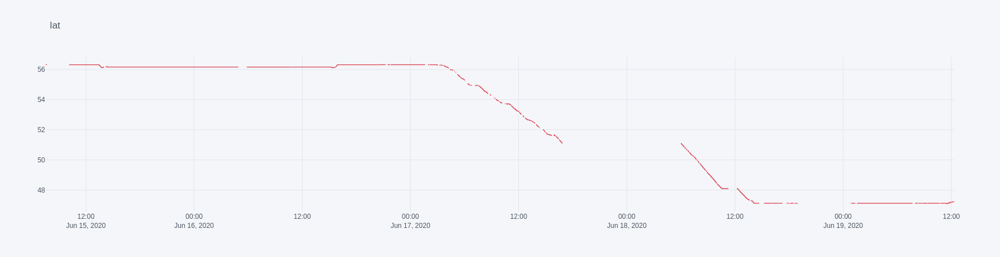

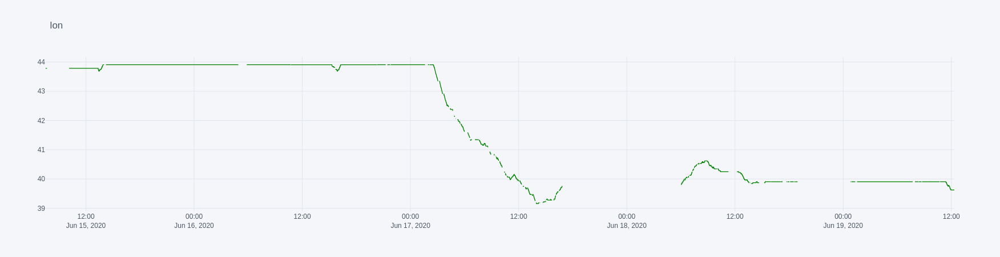

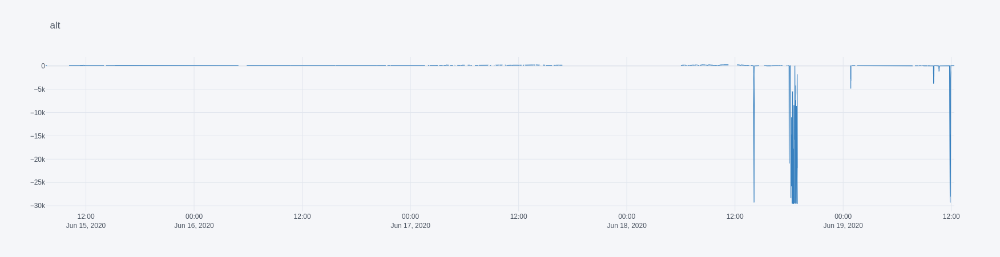

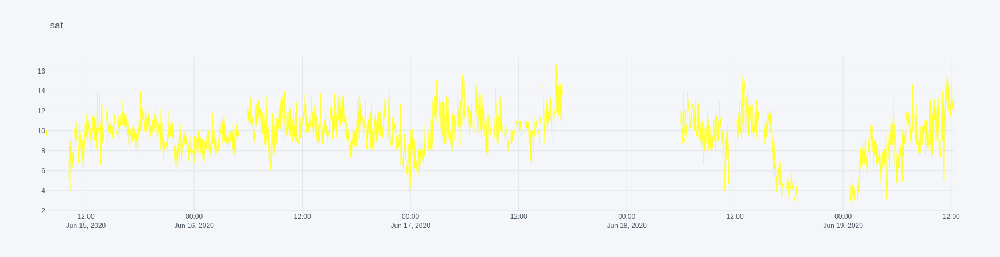

In [25]:
rand_car = np.random.choice(df['car_vin'].unique())
print(rand_car)
for col, color in zip(['lat', 'lon', 'alt', 'sat'], ['red', 'green', 'blue', 'yellow']):
    df.query('car_vin == @rand_car')[col].resample('1T').mean().iplot(color=color, title=col)

In [199]:
TYPES_FEATURES = [
    
    'car_vin' :' str',
    'imei': 'str',
    'license_plate': 'str',
    'car_model': 'str',
    
    'lat':np.float16,
    'lon':np.float16,
    'alt':np.int32,
    
    'speed':np.uint8,
    'sat', 
    'fuel', # 0 and -1
    'odom', #zeros
    
     'A1', # mostly zeros
     'A2', # binary
     'A3', # binary
     'A4', # binary
     'D1', # CONST 
     'D2', # CONST
     'D3', # CONST
     'D4', # CONST
        
     'RS232_0', 
     'RS232_1', 
    
    'Acc. Pedal 1 low idle switch',
    'Acc. Pedal Kickdown Switch',
    'Road speed limit status',
    'Acc. Pedal Position (%)',
    'Percent Load at current speed (%)',
    'Engine torque mode',
    "Driver's demand engine - percent torque (%)",
    'Actual engine - percent torque (%)',
    'Engine speed (rpm)',
    'Source address of controlling device for engine control',
    'Engine starter mode',
    'Engine demand, percent torque (%)',
    'Driver 1 working state',
    'Tachograph output shaft speed (rpm)',
    'Tachograph vehicle speed (km/h)',
    'EBS brake switch',
    'Brake pedal position (%)',
    'ABS off-road switch',
    'ASR off-road switch',
    'ASR "Hill Holder" switch',
    'Traction control override switch',
    'Accelerator interlock switch',
    'Engine derate switch',
    'Auxilary engine shutdown switch',
    'Remote accelerator enable switch',
    'Engine retarder selection',
    'ABS fully operational',
    'EBS red warning signal',
    'ABS/EBS amber warning signal',
    'ATC/ASR information signal',
    'Source address of contolling device for brake control',
    'Trailer ABS status',
    'Tractor mounted trailer ABS warning signal',
    'Trip Distance (km)',
    'Total Vehicle Distance (km)',
    'Trip Fuel (L)',
    'Total Fuel Used (L)',
    'Engine coolant temperature (C)',
    'Fuel temperature (C)',
    'Engine oil temperature 1 (C)',
    'Turbo oil temperature (C)',
    'Engine intercooler temperature (C)',
    'Engine intercooler thermostat opening (%)',
    'Fuel Delivery Pressure (kPa)',
    'Extended Crankcase Blow-by Pressure (kPa)',
    'Engine Oil Level (%)',
    'Engine Oil Pressure (kPa)',
    'Crankcase Pressure (kPa)',
    'Coolant Level (%)',
    'Washer Fluid Level (%)',
    'Fuel Level (%)',
    'Fuel Filter Differential Pressure (kPa)',
    'Engine Oil Filter Differential Pressure (kPa)',
    'Cargo Ambient Temperature (C)',
    'Axle Location',
    'Axle Weight (kg)',
    'Trailer Weight (kg)',
    'Cargo Weight (kg)',
    'Net Battery Current (A)',
    'Alternator Current (A)',
    'Charging System Potential (Voltage) (V)',
    'Battery Potential (V)',
    'Keyswitch Battery Potential (V)',
    'Two Speed Axle Switch',
    'Parking Brake Switch',
    'Cruise Control Pause Switch',
    'Park Brake Release Inhibit Request',
    'Wheel-Based Vehicle Speed (km/h)',
    'Cruise Control Active',
    'Cruise Control Enable Switch',
    'Brake Switch',
    'Clutch Switch',
    'Cruise Control Set Switch',
    'Cruise Control Resume Switch',
    'Cruise Control Accelerate Switch',
    'Cruise Control Set Speed (km/h)',
    'Cruise Control States',
    'Engine Idle Increment Switch',
    'Engine Idle Decrement Switch',
    'Engine Test Mode Switch',
    'Engine Shutdown Override Switch',
    'High Resolution Total Vehicle Distance (km)',
    'High Resolution Trip Distance (km)',
    'High Resolution Engine Trip Fuel (L)',
    'High Resolution Engine Total Fuel Used (L)'
]

In [49]:
df.head()

,car_vin,imei,license_plate,car_model,lat,lon,alt,speed,timeStop,sat,A2,A3,A4,fuel,RS232_0,RS232_1,create_date,Acc. Pedal 1 low idle switch,Acc. Pedal Kickdown Switch,Road speed limit status,Acc. Pedal Position (%),Percent Load at current speed (%),Engine torque mode,Driver's demand engine - percent torque (%),Actual engine - percent torque (%),Engine speed (rpm),Source address of controlling device for engine control,Engine starter mode,"Engine demand, percent torque (%)",Driver 1 working state,Tachograph output shaft speed (rpm),Tachograph vehicle speed (km/h),EBS brake switch,Brake pedal position (%),ABS off-road switch,ASR off-road switch,"ASR ""Hill Holder"" switch",Traction control override switch,Accelerator interlock switch,Engine derate switch,Auxilary engine shutdown switch,Remote accelerator enable switch,Engine retarder selection,ABS fully operational,EBS red warning signal,ABS/EBS amber warning signal,ATC/ASR information signal,Source address of contolling device for brake control,Trailer ABS status,Tractor mounted trailer ABS warning signal,Trip Distance (km),Total Vehicle Distance (km),Trip Fuel (L),Total Fuel Used (L),Engine coolant temperature (C),Fuel temperature (C),Engine oil temperature 1 (C),Turbo oil temperature (C),Engine intercooler temperature (C),Engine intercooler thermostat opening (%),Fuel Delivery Pressure (kPa),Extended Crankcase Blow-by Pressure (kPa),Engine Oil Level (%),Engine Oil Pressure (kPa),Crankcase Pressure (kPa),Coolant Level (%),Washer Fluid Level (%),Fuel Level (%),Fuel Filter Differential Pressure (kPa),Engine Oil Filter Differential Pressure (kPa),Cargo Ambient Temperature (C),Axle Location,Axle Weight (kg),Trailer Weight (kg),Cargo Weight (kg),Net Battery Current (A),Alternator Current (A),Charging System Potential (Voltage) (V),Battery Potential (V),Keyswitch Battery Potential (V),Two Speed Axle Switch,Parking Brake Switch,Cruise Control Pause Switch,Park Brake Release Inhibit Request,Wheel-Based Vehicle Speed (km/h),Cruise Control Active,Cruise Control Enable Switch,Brake Switch,Clutch Switch,Cruise Control Set Switch,Cruise Control Resume Switch,Cruise Control Accelerate Switch,Cruise Control Set Speed (km/h),Cruise Control States,Engine Idle Increment Switch,Engine Idle Decrement Switch,Engine Test Mode Switch,Engine Shutdown Override Switch,High Resolution Total Vehicle Distance (km),High Resolution Trip Distance (km),High Resolution Engine Trip Fuel (L),High Resolution Engine Total Fuel Used (L)
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-06-15 07:32:06,XTC549005D2439849,352094085584925,т610ех 116,КАМАЗ-5490,56.00000,54.25000,83,66,2020-06-15 07:32:06,16,-1,-1,-1,-1,1811.0,2117.0,2020-06-15 10:34:17.130,Accelerator pedal 1 in low idle condition,Kickdown passive,Not Active,0.000000,0.0,Low idle governor/no request (default mode),0.0,0.0,1055.875,0.0,None,0.0,45073.0,NaN,64.500000,Brake pedal is not being pressed,0.0,None,ASR off-road switch passive,None,Not available or not installed,None,None,None,None,NaN,Fully Operational,Off,Off,Off,NaN,Trailer ABS Status Information Not Available o...,Take no action,950485.625,956426.125,295380.5,295380.5,84.0,55.0,90.0,NaN,NaN,NaN,NaN,NaN,22.000000,312.0,NaN,100.0,NaN,40.799999,NaN,NaN,NaN,255.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,NaN,None,None,None,None,None,None,None,NaN,None,None,None,None,None,NaN,NaN,NaN,NaN
2020-06-15 07:32:06,XTC549005J2508820,352094088820938,а312уу 716,КАМАЗ-5490,54.68750,55.81250,133,85,2020-06-15 07:32:06,20,-1,-1,-1,-1,1430.0,65532.0,2020-06-15 10:34:17.213,Accelerator pedal 1 not in low idle condition,Kickdown passive,Not Active,59.200001,55.0,Accelerator pedal/operator selection,52.0,52.0,1397.500,0.0,None,52.0,45073.0,1399.000,85.000000,Brake pedal is not being pressed,0.0,None,ASR off-road switch passive,"Hill Holder"" switch passive",Not available or not installed,None,None,None,None,NaN,Fully Operational,Off,Off,Off,NaN

In [334]:
rand_vin = np.random.choice(df['car_vin'].unique())

car_df = df.query('car_vin == @rand_vin')
print(car_df.shape)
print(rand_vin)

(4578, 102)
Z9M9340325G744268


In [335]:
car_df['moving_speed'] = car_df['speed']
car_df.loc[car_df['speed'] == 0, 'moving_speed'] = np.nan

In [441]:
df

,car_vin,imei,license_plate,car_model,lat,lon,alt,speed,timeStop,sat,A2,A3,A4,fuel,RS232_0,RS232_1,create_date,Acc. Pedal 1 low idle switch,Acc. Pedal Kickdown Switch,Road speed limit status,Acc. Pedal Position (%),Percent Load at current speed (%),Engine torque mode,Driver's demand engine - percent torque (%),Actual engine - percent torque (%),Engine speed (rpm),Source address of controlling device for engine control,Engine starter mode,"Engine demand, percent torque (%)",Driver 1 working state,Tachograph output shaft speed (rpm),Tachograph vehicle speed (km/h),EBS brake switch,Brake pedal position (%),ABS off-road switch,ASR off-road switch,"ASR ""Hill Holder"" switch",Traction control override switch,Accelerator interlock switch,Engine derate switch,Auxilary engine shutdown switch,Remote accelerator enable switch,Engine retarder selection,ABS fully operational,EBS red warning signal,ABS/EBS amber warning signal,ATC/ASR information signal,Source address of contolling device for brake control,Trailer ABS status,Tractor mounted trailer ABS warning signal,Trip Distance (km),Total Vehicle Distance (km),Trip Fuel (L),Total Fuel Used (L),Engine coolant temperature (C),Fuel temperature (C),Engine oil temperature 1 (C),Turbo oil temperature (C),Engine intercooler temperature (C),Engine intercooler thermostat opening (%),Fuel Delivery Pressure (kPa),Extended Crankcase Blow-by Pressure (kPa),Engine Oil Level (%),Engine Oil Pressure (kPa),Crankcase Pressure (kPa),Coolant Level (%),Washer Fluid Level (%),Fuel Level (%),Fuel Filter Differential Pressure (kPa),Engine Oil Filter Differential Pressure (kPa),Cargo Ambient Temperature (C),Axle Location,Axle Weight (kg),Trailer Weight (kg),Cargo Weight (kg),Net Battery Current (A),Alternator Current (A),Charging System Potential (Voltage) (V),Battery Potential (V),Keyswitch Battery Potential (V),Two Speed Axle Switch,Parking Brake Switch,Cruise Control Pause Switch,Park Brake Release Inhibit Request,Wheel-Based Vehicle Speed (km/h),Cruise Control Active,Cruise Control Enable Switch,Brake Switch,Clutch Switch,Cruise Control Set Switch,Cruise Control Resume Switch,Cruise Control Accelerate Switch,Cruise Control Set Speed (km/h),Cruise Control States,Engine Idle Increment Switch,Engine Idle Decrement Switch,Engine Test Mode Switch,Engine Shutdown Override Switch,High Resolution Total Vehicle Distance (km),High Resolution Trip Distance (km),High Resolution Engine Trip Fuel (L),High Resolution Engine Total Fuel Used (L),moving_speed
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-06-15 07:32:06,XTC549005D2439849,352094085584925,т610ех 116,КАМАЗ-5490,56.00000,54.25000,83,66,2020-06-15 07:32:06,16,-1,-1,-1,-1,1811.0,2117.0,2020-06-15 10:34:17.130,Accelerator pedal 1 in low idle condition,Kickdown passive,Not Active,0.000000,0.0,Low idle governor/no request (default mode),0.0,0.0,1055.875,0.0,None,0.0,45073.0,NaN,64.500000,Brake pedal is not being pressed,0.0,None,ASR off-road switch passive,None,Not available or not installed,None,None,None,None,NaN,Fully Operational,Off,Off,Off,NaN,Trailer ABS Status Information Not Available o...,Take no action,950485.625000,956426.125000,295380.500000,295380.500000,84.0,55.0,90.00000,NaN,NaN,NaN,NaN,NaN,22.000000,312.0,NaN,100.0,NaN,40.799999,NaN,NaN,NaN,255.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,NaN,None,None,None,None,None,None,None,NaN,None,None,None,None,None,NaN,NaN,NaN,NaN,66.0
2020-06-15 07:32:06,XTC549005J2508820,352094088820938,а312уу 716,КАМАЗ-5490,54.68750,55.81250,133,85,2020-06-15 07:32:06,20,-1,-1,-1,-1,1430.0,65532.0,2020-06-15 10:34:17.213,Accelerator pedal 1 not in low idle condition,Kickdown passive,Not Active,59.200001,55.0,Accelerator pedal/operator selection,52.0,52.0,1397.500,0.0,None,52.0,45073.0,1399.000,85.000000,Brake pedal is not being pressed,0.0,None,ASR off-road switch passive,"Hill Holder"" switch passive",Not available or not installed,None,None,None,Non

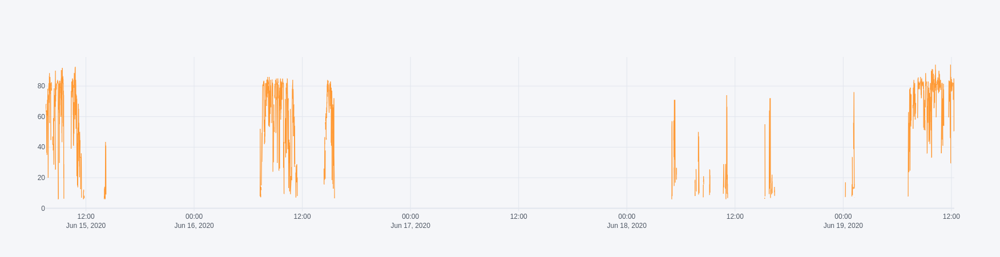

In [451]:
ts = car_df['moving_speed'].resample('30s').mean()
ts.iplot()

In [456]:
df = df[df.car_vin != 'None']

df['moving_speed'] = df['speed']
df.loc[df['speed'] == 0, 'moving_speed'] = np.nan

ts = df.groupby('car_vin')['moving_speed'].resample('30s').mean()

In [457]:
%time tmp = ts.groupby('car_vin').apply(split_trip_nan)

CPU times: user 2min 16s, sys: 0 ns, total: 2min 16s
Wall time: 2min 16s


In [458]:
ts_size = 10
res = []
for car_vin in tmp.index:
    for ts in tmp.loc[car_vin]:
        ts = ts.tolist()
        for i in range(len(ts) - ts_size):
            res.append(ts[i:i+ts_size])
res = np.asarray(res)

In [459]:
res.shape

(130160, 10)

In [460]:
corr = np.corrcoef(res[:10_000]**2)
corr = corr*(1 - np.eye(N=corr.shape[0]))

In [468]:
similarity

array([[4473, 8005, 1726, ..., 1403, 5749, 4078],
       [3526, 8006, 1727, ..., 9014, 8797, 4078],
       [7883, 7412,  784, ..., 1882, 8798, 4078],
       ...,
       [2556, 9969, 6412, ..., 9407, 6914, 4078],
       [1644, 7599, 8172, ..., 9408, 6915, 4078],
       [9346, 1945, 7004, ..., 6916, 3065, 4078]])

In [469]:
similarity = np.argsort(corr)#[:,-10:]

1. Разгон с места
2. Равномерная езда
3. Разгон с движения с целью увеличения крейсерской скорости
4. Замедление в движении с целью уменьшения крейсерской скорости
5. Замедление до полной остановки
6. Обгон

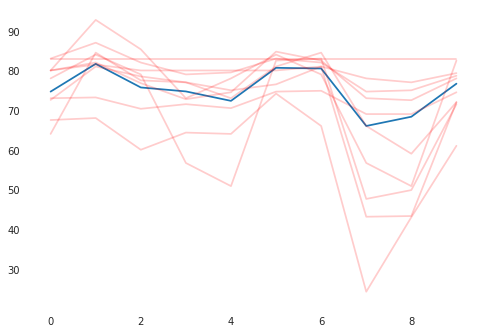

In [466]:
rand_chunk = np.random.choice(len(similarity))

plt.plot(res[rand_chunk])

for i in similarity[rand_chunk]:
    plt.plot(res[i], color='red', alpha=0.2)

In [424]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, Normalizer
from sklearn.pipeline import make_pipeline

In [472]:
transformer = make_pipeline(Normalizer(), PCA(n_components=2))
proj = transformer.fit_transform(res[:1_000])

In [474]:
np.correlate(proj**2)

TypeError: _correlate_dispatcher() missing 1 required positional argument: 'v'

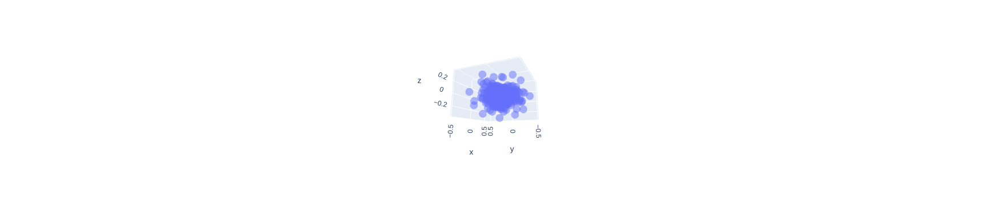

In [436]:
px.scatter_3d(x=proj[:,0],y=proj[:,1],z=proj[:,2], opacity=0.5,
              height=100)

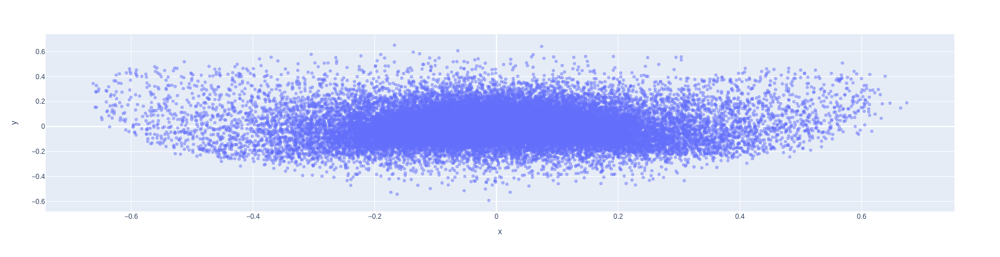

In [430]:
# px.scatter(x=proj[:,0],y=proj[:,1], opacity=0.5)

In [476]:
import scipy

In [480]:
from sklearn.metrics import pairwise_distances

In [479]:
1000*(1000-1)/2

499500.0

In [482]:
a = res[:1000]

In [488]:
a**2

array([[ 106.77777778,  196.        ,  441.        , ..., 5550.25      ,
        5076.5625    , 6195.93877551],
       [ 196.        ,  441.        ,  253.34027778, ..., 5076.5625    ,
        6195.93877551, 4658.0625    ],
       [ 441.        ,  253.34027778,  465.84027778, ..., 6195.93877551,
        4658.0625    , 6241.        ],
       ...,
       [6765.0625    , 7534.24      , 5550.25      , ..., 4515.84      ,
        6889.        , 6400.        ],
       [7534.24      , 5550.25      , 3025.        , ..., 6889.        ,
        6400.        , 5929.        ],
       [5550.25      , 3025.        , 2952.11111111, ..., 6400.        ,
        5929.        , 4993.77777778]])

In [489]:
2*np.dot(a.T, a)

array([[9424048.19235057, 9348135.4095095 , 9300574.1441337 ,
        9263033.49905569, 9261896.0934576 , 9262251.89181523,
        9272793.83685201, 9269295.38305178, 9228031.22699901,
        9180540.33377127],
       [9348135.4095095 , 9549071.83172006, 9474027.52351885,
        9390878.36132924, 9363056.95075808, 9351812.16358562,
        9364351.62829431, 9357764.09705042, 9327003.17614702,
        9263527.52810013],
       [9300574.1441337 , 9474027.52351885, 9678178.50163936,
        9556663.77917149, 9476078.16602185, 9440354.35570518,
        9441567.49585715, 9433640.95617129, 9399483.70591285,
        9346833.84408094],
       [9263033.49905569, 9390878.36132924, 9556663.77917149,
        9706040.900296  , 9588875.14237815, 9506716.34814917,
        9478077.25680758, 9463061.8306546 , 9430458.94237397,
        9378738.48387444],
       [9261896.0934576 , 9363056.95075808, 9476078.16602185,
        9588875.14237815, 9754891.30600384, 9629666.25519589,
        9555287.67699116

In [493]:
a.shape

(1000, 10)

In [502]:
pairwise_distances(a)

array([[  0.        ,  43.03132812,  65.56094973, ..., 141.59200837,
        136.41535697, 131.0960195 ],
       [ 43.03132812,   0.        ,  44.20195986, ..., 125.95562654,
        122.28185634, 112.99486176],
       [ 65.56094973,  44.20195986,   0.        , ..., 115.30443399,
        105.88086398,  98.60251942],
       ...,
       [141.59200837, 125.95562654, 115.30443399, ...,   0.        ,
         35.17206821,  51.08241053],
       [136.41535697, 122.28185634, 105.88086398, ...,  35.17206821,
          0.        ,  35.44690386],
       [131.0960195 , 112.99486176,  98.60251942, ...,  51.08241053,
         35.44690386,   0.        ]])

In [503]:
np.sqrt(((a.reshape(-1, 1000, 10) - a.reshape(1000, -1, 10))**2).sum(axis=2))

array([[  0.        ,  43.03132812,  65.56094973, ..., 141.59200837,
        136.41535697, 131.0960195 ],
       [ 43.03132812,   0.        ,  44.20195986, ..., 125.95562654,
        122.28185634, 112.99486176],
       [ 65.56094973,  44.20195986,   0.        , ..., 115.30443399,
        105.88086398,  98.60251942],
       ...,
       [141.59200837, 125.95562654, 115.30443399, ...,   0.        ,
         35.17206821,  51.08241053],
       [136.41535697, 122.28185634, 105.88086398, ...,  35.17206821,
          0.        ,  35.44690386],
       [131.0960195 , 112.99486176,  98.60251942, ...,  51.08241053,
         35.44690386,   0.        ]])

(1000, 1, 10)

In [490]:
a.T**2

array([[ 106.77777778,  196.        ,  441.        , ..., 6765.0625    ,
        7534.24      , 5550.25      ],
       [ 196.        ,  441.        ,  253.34027778, ..., 7534.24      ,
        5550.25      , 3025.        ],
       [ 441.        ,  253.34027778,  465.84027778, ..., 5550.25      ,
        3025.        , 2952.11111111],
       ...,
       [5550.25      , 5076.5625    , 6195.93877551, ..., 4515.84      ,
        6889.        , 6400.        ],
       [5076.5625    , 6195.93877551, 4658.0625    , ..., 6889.        ,
        6400.        , 5929.        ],
       [6195.93877551, 4658.0625    , 6241.        , ..., 6400.        ,
        5929.        , 4993.77777778]])

In [481]:
pairwise_distances(res[:1000])

array([[  0.        ,  43.03132812,  65.56094973, ..., 141.59200837,
        136.41535697, 131.0960195 ],
       [ 43.03132812,   0.        ,  44.20195986, ..., 125.95562654,
        122.28185634, 112.99486176],
       [ 65.56094973,  44.20195986,   0.        , ..., 115.30443399,
        105.88086398,  98.60251942],
       ...,
       [141.59200837, 125.95562654, 115.30443399, ...,   0.        ,
         35.17206821,  51.08241053],
       [136.41535697, 122.28185634, 105.88086398, ...,  35.17206821,
          0.        ,  35.44690386],
       [131.0960195 , 112.99486176,  98.60251942, ...,  51.08241053,
         35.44690386,   0.        ]])

In [478]:
scipy.spatial.distance.pdist(res[:1000]).shape

(499500,)

In [475]:
res[:1_000]**2

array([[ 106.77777778,  196.        ,  441.        , ..., 5550.25      ,
        5076.5625    , 6195.93877551],
       [ 196.        ,  441.        ,  253.34027778, ..., 5076.5625    ,
        6195.93877551, 4658.0625    ],
       [ 441.        ,  253.34027778,  465.84027778, ..., 6195.93877551,
        4658.0625    , 6241.        ],
       ...,
       [6765.0625    , 7534.24      , 5550.25      , ..., 4515.84      ,
        6889.        , 6400.        ],
       [7534.24      , 5550.25      , 3025.        , ..., 6889.        ,
        6400.        , 5929.        ],
       [5550.25      , 3025.        , 2952.11111111, ..., 6400.        ,
        5929.        , 4993.77777778]])

In [137]:
car_df.sample(3)

,car_vin,imei,license_plate,car_model,lat,lon,alt,speed,timeStop,sat,A2,A3,A4,fuel,RS232_0,RS232_1,create_date,Acc. Pedal 1 low idle switch,Acc. Pedal Kickdown Switch,Road speed limit status,Acc. Pedal Position (%),Percent Load at current speed (%),Engine torque mode,Driver's demand engine - percent torque (%),Actual engine - percent torque (%),Engine speed (rpm),Source address of controlling device for engine control,Engine starter mode,"Engine demand, percent torque (%)",Driver 1 working state,Tachograph output shaft speed (rpm),Tachograph vehicle speed (km/h),EBS brake switch,Brake pedal position (%),ABS off-road switch,ASR off-road switch,"ASR ""Hill Holder"" switch",Traction control override switch,Accelerator interlock switch,Engine derate switch,Auxilary engine shutdown switch,Remote accelerator enable switch,Engine retarder selection,ABS fully operational,EBS red warning signal,ABS/EBS amber warning signal,ATC/ASR information signal,Source address of contolling device for brake control,Trailer ABS status,Tractor mounted trailer ABS warning signal,Trip Distance (km),Total Vehicle Distance (km),Trip Fuel (L),Total Fuel Used (L),Engine coolant temperature (C),Fuel temperature (C),Engine oil temperature 1 (C),Turbo oil temperature (C),Engine intercooler temperature (C),Engine intercooler thermostat opening (%),Fuel Delivery Pressure (kPa),Extended Crankcase Blow-by Pressure (kPa),Engine Oil Level (%),Engine Oil Pressure (kPa),Crankcase Pressure (kPa),Coolant Level (%),Washer Fluid Level (%),Fuel Level (%),Fuel Filter Differential Pressure (kPa),Engine Oil Filter Differential Pressure (kPa),Cargo Ambient Temperature (C),Axle Location,Axle Weight (kg),Trailer Weight (kg),Cargo Weight (kg),Net Battery Current (A),Alternator Current (A),Charging System Potential (Voltage) (V),Battery Potential (V),Keyswitch Battery Potential (V),Two Speed Axle Switch,Parking Brake Switch,Cruise Control Pause Switch,Park Brake Release Inhibit Request,Wheel-Based Vehicle Speed (km/h),Cruise Control Active,Cruise Control Enable Switch,Brake Switch,Clutch Switch,Cruise Control Set Switch,Cruise Control Resume Switch,Cruise Control Accelerate Switch,Cruise Control Set Speed (km/h),Cruise Control States,Engine Idle Increment Switch,Engine Idle Decrement Switch,Engine Test Mode Switch,Engine Shutdown Override Switch,High Resolution Total Vehicle Distance (km),High Resolution Trip Distance (km),High Resolution Engine Trip Fuel (L),High Resolution Engine Total Fuel Used (L)
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-06-19 01:50:35,XTC549015K2518883,861107038050747,В511СН 716,КАМАЗ-54901,55.75,52.46875,156,0,2020-06-19 01:50:35,9,0,0,0,0,0.0,0.0,2020-06-19 04:52:33.537,Accelerator pedal 1 not in low idle condition,Kickdown passive,Active,0.0,0.0,Low idle governor/no request (default mode),NaN,NaN,0.0,0.0,Start not requested,-125.0,45056.0,0.00,0.000000,None,NaN,None,None,None,Not available or not installed,None,None,None,None,NaN,None,Take no action,Take no action,Take no action,NaN,Trailer ABS Status Information Not Available o...,Take no action,0.00000,0.000000,0.000000,0.000000,-40.0,-40.0,-273.0000,-251.34375,141.0,0.8,0.0,0.0,0.0,0.0,-250.0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,92672.0,92676.0,117.0,242.0,620.150024,0.000000,0.000000,Low speed range,Parking brake not set,Off,Park Brake Release Inhibit not requested,0.0,Cruise control switched off,Cruise control disabled,Brake pedal released,Clutch pedal released,Cruise control activator not in the position “...,Cruise control activator not in the position “...,Cruise control activator not in the position “...,0.0,Off/Disabled,Off,Off,Off,Off,0.000000,0.00000,0.000000,0.000000
2020-06-19 00:24:28,XTC549015K2518883,861107038050747,В511СН 716,КАМАЗ-54901,55.75,52.46875,173,0,2020-06-19 00:24:28,10,0,0,0,0,0.0,0.0,2020-06-19 03:26:38.377,Accelerator pedal 1 not in low idle condition,Kickdown passive,Active,0.0,0.0,Low idle governor/no reque

In [135]:
car_df[car_df['speed']==0]

,car_vin,imei,license_plate,car_model,lat,lon,alt,speed,timeStop,sat,A2,A3,A4,fuel,RS232_0,RS232_1,create_date,Acc. Pedal 1 low idle switch,Acc. Pedal Kickdown Switch,Road speed limit status,Acc. Pedal Position (%),Percent Load at current speed (%),Engine torque mode,Driver's demand engine - percent torque (%),Actual engine - percent torque (%),Engine speed (rpm),Source address of controlling device for engine control,Engine starter mode,"Engine demand, percent torque (%)",Driver 1 working state,Tachograph output shaft speed (rpm),Tachograph vehicle speed (km/h),EBS brake switch,Brake pedal position (%),ABS off-road switch,ASR off-road switch,"ASR ""Hill Holder"" switch",Traction control override switch,Accelerator interlock switch,Engine derate switch,Auxilary engine shutdown switch,Remote accelerator enable switch,Engine retarder selection,ABS fully operational,EBS red warning signal,ABS/EBS amber warning signal,ATC/ASR information signal,Source address of contolling device for brake control,Trailer ABS status,Tractor mounted trailer ABS warning signal,Trip Distance (km),Total Vehicle Distance (km),Trip Fuel (L),Total Fuel Used (L),Engine coolant temperature (C),Fuel temperature (C),Engine oil temperature 1 (C),Turbo oil temperature (C),Engine intercooler temperature (C),Engine intercooler thermostat opening (%),Fuel Delivery Pressure (kPa),Extended Crankcase Blow-by Pressure (kPa),Engine Oil Level (%),Engine Oil Pressure (kPa),Crankcase Pressure (kPa),Coolant Level (%),Washer Fluid Level (%),Fuel Level (%),Fuel Filter Differential Pressure (kPa),Engine Oil Filter Differential Pressure (kPa),Cargo Ambient Temperature (C),Axle Location,Axle Weight (kg),Trailer Weight (kg),Cargo Weight (kg),Net Battery Current (A),Alternator Current (A),Charging System Potential (Voltage) (V),Battery Potential (V),Keyswitch Battery Potential (V),Two Speed Axle Switch,Parking Brake Switch,Cruise Control Pause Switch,Park Brake Release Inhibit Request,Wheel-Based Vehicle Speed (km/h),Cruise Control Active,Cruise Control Enable Switch,Brake Switch,Clutch Switch,Cruise Control Set Switch,Cruise Control Resume Switch,Cruise Control Accelerate Switch,Cruise Control Set Speed (km/h),Cruise Control States,Engine Idle Increment Switch,Engine Idle Decrement Switch,Engine Test Mode Switch,Engine Shutdown Override Switch,High Resolution Total Vehicle Distance (km),High Resolution Trip Distance (km),High Resolution Engine Trip Fuel (L),High Resolution Engine Total Fuel Used (L)
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-06-15 09:10:45,XTC549015K2518883,861107038050747,В511СН 716,КАМАЗ-54901,54.59375,53.71875,114,0,2020-06-15 09:10:45,10,0,0,0,0,0.0,0.0,2020-06-15 12:12:18.390,Accelerator pedal 1 in low idle condition,Kickdown passive,Not Active,0.0,13.0,Low idle governor/no request (default mode),0.0,7.0,593.5,NaN,None,NaN,45072.0,0.00,0.000000,None,NaN,None,None,None,Not available or not installed,None,None,None,None,NaN,None,Take no action,Take no action,Take no action,NaN,Trailer ABS Status Information Not Available o...,Take no action,6900.484863,174641.890625,43.595001,50711.312500,79.0,33.0,-40.03125,-234.59375,165.0,1.6,0.0,NaN,0.0,172.0,NaN,90.0,NaN,NaN,NaN,NaN,NaN,31.0,3623.0,105470.0,104968.0,98.0,223.0,769.100037,27.850000,27.850000,Low speed range,Error,Error Indicator,Park Brake Release Inhibit not requested,0.000000,Cruise control switched off,Cruise control disabled,Brake pedal released,Clutch pedal released,None,None,None,250.0,None,None,None,None,None,174641.890625,6900.484863,43.595001,50711.312500
2020-06-15 09:10:47,XTC549015K2518883,861107038050747,В511СН 716,КАМАЗ-54901,54.59375,53.71875,114,0,2020-06-15 09:10:47,9,0,0,0,0,0.0,0.0,2020-06-15 12:12:18.390,Accelerator pedal 1 in low idle condition,Kickdown passive,Not Active,0.0,13.0,Low idle governor/no request (default mode),0.0,7.0,598.5,NaN,None,NaN,45072.0,0.00,0.000000,None,NaN,None,None,None,Not available or not

In [89]:
tmp = df['timeStop'].reset_index()

In [91]:
tmp

,time,timeStop
0,2020-06-15 07:32:06,2020-06-15 07:32:06
1,2020-06-15 07:32:06,2020-06-15 07:32:06
2,2020-06-15 07:32:06,2020-06-15 07:32:06
3,2020-06-15 07:32:06,2020-06-15 07:32:06
4,2020-06-15 07:32:07,2020-06-15 07:32:07
...,...,...
3694597,2020-06-19 12:20:22,2020-06-19 12:20:22
3694598,2020-06-19 12:20:23,2020-06-19 12:20:23
3694599,2020-06-19 12:20:24,2020-06-19 12:20:24
3694600,2020-06-19 12:20:25,2020-06-19 12:20:25


In [94]:
(tmp['timeStop'] == tmp['time']).mean()

1.0

In [67]:
tmp = df.groupby('car_vin')['speed'].resample('1T').mean()

XTC549005E2447671


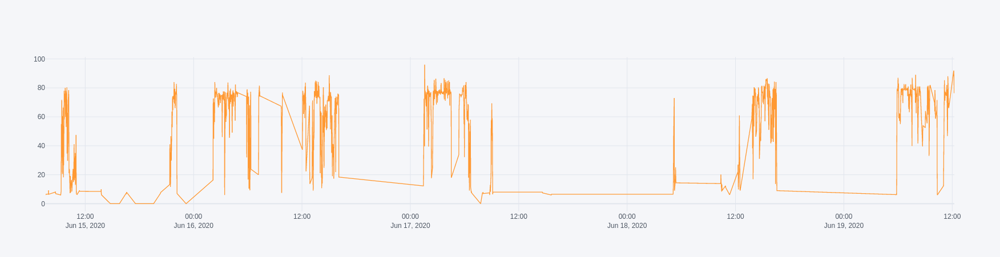

In [75]:
rand_vin = np.random.choice(df['car_vin'].unique())
ts = tmp.loc[rand_vin].dropna().astype(float)
print(rand_vin)
ts.iplot()

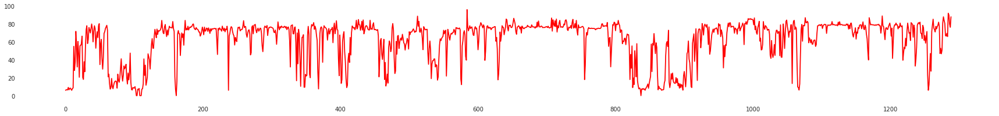

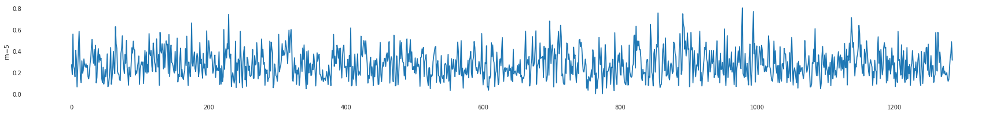

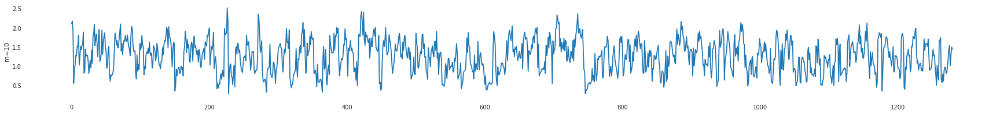

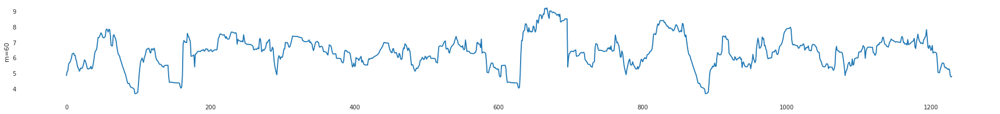

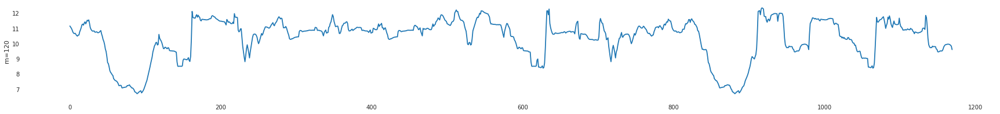

In [76]:
plt.figure(figsize=(30,3))
plt.plot(ts.values, color='red')
plt.show()

for m in [5, 10, 60, 120]:
    plt.figure(figsize=(30,3))
    plt.plot(stumpy.stump(ts, m)[:,0])
    plt.ylabel(f'm={m}')
    plt.show()